# Вычислительное музыковедение: Модели и методы Music Data Mining

## Лабораторная работа №5. Инструменты работы с нейронными сетями

### Работа с данными

Полезные ссылки:
1. http://ismir2001.ismir.net/pdf/tzanetakis.pdf
2. https://huggingface.co/datasets/marsyas/gtzan

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.9/388.9 kB 10.5 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.20.3
    Uninstalling huggingface-hub-0.20.3:
      Successfully uninstalled huggingface-hub-0.20.3


In [ ]:
from datasets import load_dataset

dataset = load_dataset("marsyas/gtzan")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1486: FutureWarning: The repository for marsyas/gtzan contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/marsyas/gtzan
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.war

Generating train split: 0 examples [00:00, ? examples/s]

GTZAN is a dataset for musical genre classification of audio signals. The dataset consists of 1,000 audio tracks, each of 30 seconds long. It contains 10 genres, each represented by 100 tracks. The tracks are all 22,050Hz Mono 16-bit audio files in WAV format. The genres are: blues, classical, country, disco, hiphop, jazz, metal, pop, reggae, and rock.

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['file', 'audio', 'genre'],
        num_rows: 999
    })
})

In [ ]:
dataset['train'][998]

{'file': '/root/.cache/huggingface/datasets/downloads/extracted/5022b0984afa7334ff9a3c60566280b08b5179d4ac96a628052bada7d8940244/genres/rock/rock.00099.wav',
 'audio': {'path': '/root/.cache/huggingface/datasets/downloads/extracted/5022b0984afa7334ff9a3c60566280b08b5179d4ac96a628052bada7d8940244/genres/rock/rock.00099.wav',
  'array': array([-0.02111816, -0.03451538, -0.03536987, ...,  0.00134277,
          0.00250244, -0.00186157]),
  'sampling_rate': 22050},
 'genre': 9}

In [ ]:
num2class = {
    0: 'blues',
    1: 'classical',
    2: 'country',
    3: 'disco',
    4: 'hiphop',
    5: 'jazz',
    6: 'metal',
    7: 'pop',
    8: 'reggae',
    9: 'rock'
}

In [ ]:
import IPython.display as ipd

idx = 111

print(dataset['train'][idx]['file'].split('/')[-1]) # num2class[...]
print(num2class.get(dataset['train'][idx]['genre'], 'Unknown')) # num2class[...]
ipd.Audio(dataset['train'][idx]['audio']['array'], rate=dataset['train'][idx]['audio']['sampling_rate'])

classical.00011.wav
classical


### Инстурмент Open SMILE

In [ ]:
!pip install opensmile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 996.2/996.2 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.9/140.9 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.4/138.4 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.4/167.4 kB 13.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for iso-639: filename=iso_639-0.4.5-py3-none-any.whl size=168840 sha256=be9b5e6f1a82610483d7c44fcb9a0f2f259c1f61d3fb828ce9ef280c828828cd
  Stored in directory: /root/.cache/pip/wheels/d8/78/cc/5478ca3b1c3f602eae6f8cdbd78f909c0a0bfa0bbcb5c7771f
Successfully built iso-639


In [ ]:
signal = dataset['train'][idx]['audio']['array']
sr = dataset['train'][idx]['audio']['sampling_rate']

Извлекаемые множества признаки: https://audeering.github.io/opensmile-python/api/opensmile.FeatureSet.html

In [ ]:
import opensmile

smile = opensmile.Smile(
    feature_set=opensmile.FeatureSet.eGeMAPSv02,
    feature_level=opensmile.FeatureLevel.LowLevelDescriptors,
)
smile.feature_names

['Loudness_sma3',
 'alphaRatio_sma3',
 'hammarbergIndex_sma3',
 'slope0-500_sma3',
 'slope500-1500_sma3',
 'spectralFlux_sma3',
 'mfcc1_sma3',
 'mfcc2_sma3',
 'mfcc3_sma3',
 'mfcc4_sma3',
 'F0semitoneFrom27.5Hz_sma3nz',
 'jitterLocal_sma3nz',
 'shimmerLocaldB_sma3nz',
 'HNRdBACF_sma3nz',
 'logRelF0-H1-H2_sma3nz',
 'logRelF0-H1-A3_sma3nz',
 'F1frequency_sma3nz',
 'F1bandwidth_sma3nz',
 'F1amplitudeLogRelF0_sma3nz',
 'F2frequency_sma3nz',
 'F2bandwidth_sma3nz',
 'F2amplitudeLogRelF0_sma3nz',
 'F3frequency_sma3nz',
 'F3bandwidth_sma3nz',
 'F3amplitudeLogRelF0_sma3nz']

In [ ]:
smile.process_signal(
    signal, sr
)

,,Loudness_sma3,alphaRatio_sma3,hammarbergIndex_sma3,slope0-500_sma3,slope500-1500_sma3,spectralFlux_sma3,mfcc1_sma3,mfcc2_sma3,mfcc3_sma3,mfcc4_sma3,...,logRelF0-H1-A3_sma3nz,F1frequency_sma3nz,F1bandwidth_sma3nz,F1amplitudeLogRelF0_sma3nz,F2frequency_sma3nz,F2bandwidth_sma3nz,F2amplitudeLogRelF0_sma3nz,F3frequency_sma3nz,F3bandwidth_sma3nz,F3amplitudeLogRelF0_sma3nz
start,end,,,,,,,,,,,,,,,,,,,,,
0 days 00:00:00,0 days 00:00:00.020000,0.616998,-6.081289,12.642415,0.018853,-0.024449,0.047097,22.321638,-9.760304,5.344826,-5.867167,...,11.392544,443.104584,1113.729614,2.397139,1449.308960,972.983398,-10.694065,2487.810791,949.879578,-9.595878
0 days 00:00:00.010022676,0 days 00:00:00.030022676,0.618532,-7.344420,13.142392,0.023633,-0.020717,0.104154,22.739700,-8.581505,7.408136,-9.039139,...,12.503006,544.170410,1214.276611,0.000000,1634.653931,932.848145,-12.716716,2696.301514,915.339355,-11.694969
0 days 00:00:00.020045351,0 days 00:00:00.040045351,0.622960,-9.093999,14.238187,0.031828,-0.016394,0.167983,22.507935,-6.816754,9.184848,-13.005357,...,12.532550,673.189941,1250.685791,0.379864,1794.313965,875.926086,-12.276127,2875.066406,804.056396,-12.080731
0 days 00:00:00.030068027,0 days 00:00:00.050068027,0.615778,-9.132001,11.456280,0.048014,-0.019908,0.186342,21.218586,-5.120774,9.476525,-13.455940,...,14.133728,770.916443,1324.569092,1.558449,1943.182251,721.071106,-9.983392,3039.956055,759.712891,-12.575278
0 days 00:00:00.040090703,0 days 00:00:00.060090703,0.603381,-7.937592,10.832192,0.048651,-0.020959,0.203530,19.551813,-3.528833,11.054545,-7.971434,...,14.472516,626.845032,1389.055054,2.622048,1739.434448,754.724182,-5.151148,2966.456055,774.165833,-10.384744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:00:29.917687075,0 days 00:00:29.937687075,0.170535,-2.343140,4.704902,-0.030410,-0.026070,0.018246,8.151047,-21.351248,1.732835,-15.978424,...,1.187482,435.628540,1228.511475,0.000000,1502.593872,1579.015747,-2.061458,2270.860596,1048.166504,-10.453495
0 days 00:00:29.927709751,0 days 00:00:29.947709751,0.173180,-2.561466,6.585139,-0.022819,-0.026244,0.019820,7.364591,-20.239168,4.552948,-17.119429,...,-8.442597,459.584473,922.548523,0.000000,1535.689453,849.583557,-2.053082,2468.706299,938.064392,-5.309783
0 days 00:00:29.937732426,0 days 00:00:29.957732426,0.170760,-3.785945,9.244433,-0.042694,-0.031378,0.021083,7.198791,-18.776623,5.748409,-17.757212,...,-10.657845,488.898346,789.177429,0.000000,1548.398804,719.236877,-3.051175,2553.667969,814.538330,-5.877562


In [ ]:
smile = opensmile.Smile()
result = smile.process_signal(
    signal, sr
)
result

,,audspec_lengthL1norm_sma_range,audspec_lengthL1norm_sma_maxPos,audspec_lengthL1norm_sma_minPos,audspec_lengthL1norm_sma_quartile1,audspec_lengthL1norm_sma_quartile2,audspec_lengthL1norm_sma_quartile3,audspec_lengthL1norm_sma_iqr1-2,audspec_lengthL1norm_sma_iqr2-3,audspec_lengthL1norm_sma_iqr1-3,audspec_lengthL1norm_sma_percentile1.0,...,mfcc_sma_de[14]_peakRangeAbs,mfcc_sma_de[14]_peakRangeRel,mfcc_sma_de[14]_peakMeanAbs,mfcc_sma_de[14]_peakMeanMeanDist,mfcc_sma_de[14]_peakMeanRel,mfcc_sma_de[14]_minRangeRel,mfcc_sma_de[14]_meanRisingSlope,mfcc_sma_de[14]_stddevRisingSlope,mfcc_sma_de[14]_meanFallingSlope,mfcc_sma_de[14]_stddevFallingSlope
start,end,,,,,,,,,,,,,,,,,,,,,
0 days,0 days 00:00:30.013333333,0.739473,0.12454,0.993639,0.361962,0.421418,0.501554,0.059456,0.080136,0.139592,0.186169,...,7.229427,0.558557,1.993228,1.998537,-19.98591,0.768963,93.221306,46.487316,92.442406,45.212151


In [ ]:
result.to_numpy()

array([[ 0.7394734 ,  0.12453967,  0.9936391 , ..., 46.487316  ,
        92.442406  , 45.21215   ]], dtype=float32)

### Подготовка датасета

In [ ]:
# from tqdm import tqdm

# smile = opensmile.Smile()

# prepared_data = []

# for idx in tqdm(range(len(dataset['train']))):
#     signal = dataset['train'][idx]['audio']['array']
#     sr = dataset['train'][idx]['audio']['sampling_rate']
#     genre = dataset['train'][idx]['genre']
#     features = smile.process_signal(signal, sr).to_numpy()[0]
#     prepared_data.append({
#         'id': idx,
#         'features': features,
#         'genre': genre
#     })


100%|██████████| 999/999 [24:49<00:00,  1.49s/it]


In [ ]:
# import numpy as np
# # Сохранить
# file_name = 'smile_features.npy'
# # np.save(file_name, prepared_data, allow_pickle=True) # Не забудьте закомментировать, чтобы не перезаписать или еще что.

# # Извлечь
# data = np.load(file_name, allow_pickle=True)
# len(data)

999

In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(data, test_size=0.3, random_state=111)

In [ ]:
len(train_data), len(test_data)

(699, 300)

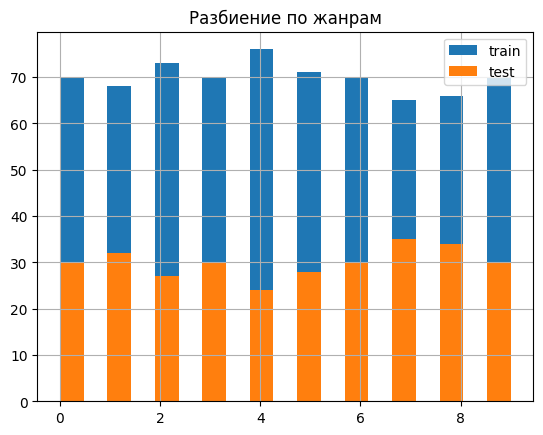

In [ ]:
import matplotlib.pyplot as plt

plt.hist([elem['genre'] for elem in train_data], 19, label='train')
plt.hist([elem['genre'] for elem in test_data], 19, label='test')
plt.legend()
plt.title('Разбиение по жанрам')
plt.grid()
plt.show()

### Нейронки

#### Comet ML

https://www.comet.com/site/

Читаем, изучаем: https://www.comet.com/docs/v2/api-and-sdk/python-sdk/reference/Experiment/#experimentlog_model

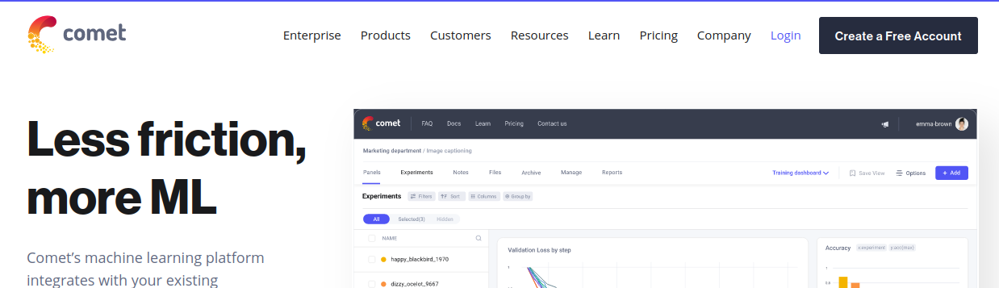

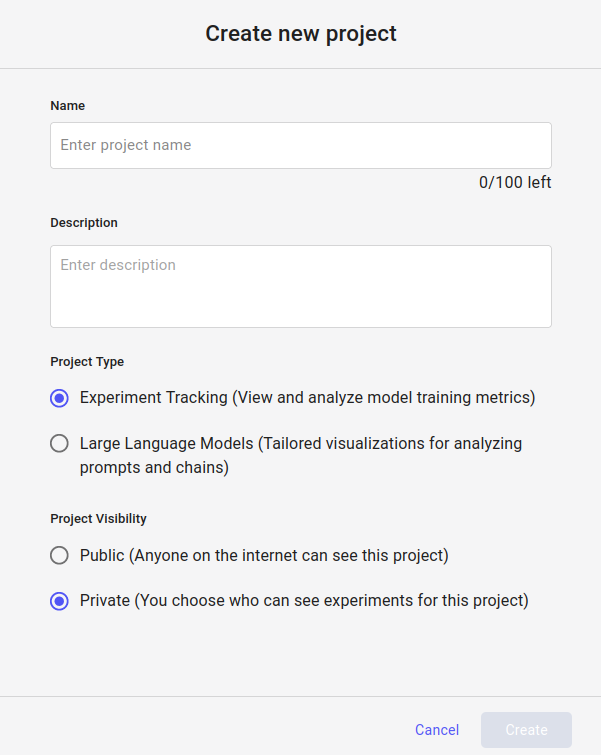

In [ ]:
!pip install comet_ml

In [ ]:
import comet_ml
from comet_ml import Experiment


# Create an experiment with your api key
experiment = Experiment(
  api_key="lgYiNThhNpW1jPT720lzYYqJg",
  project_name="mir-itmo-5lab",
  workspace="lvodoleyl"
)

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: sklearn, torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/lvodoleyl/mir-itmo-5lab/3751fd4f6b5d49199b003144a51c1599



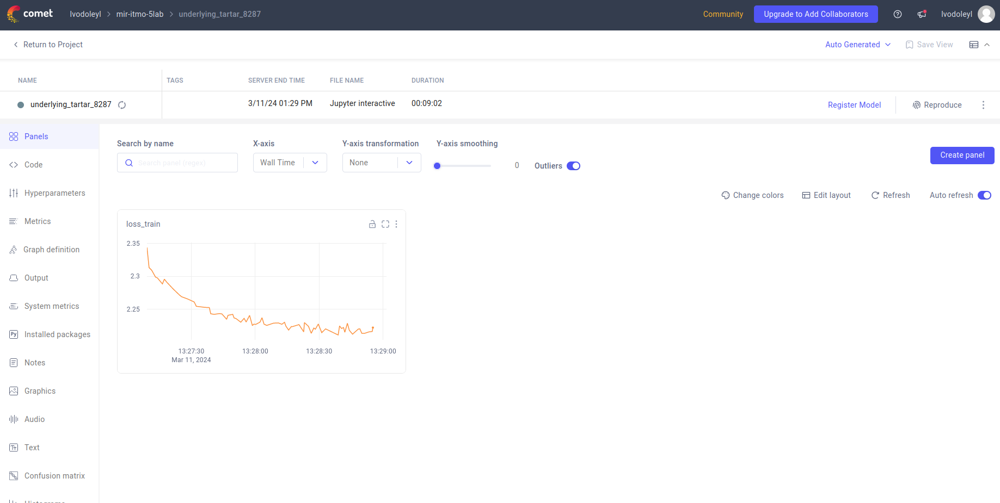

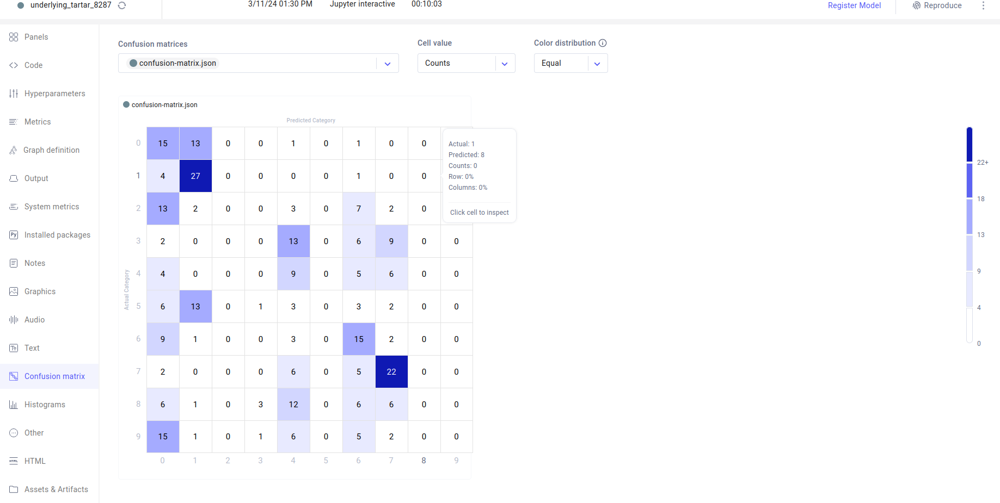

#### PyTotch

In [ ]:
import torch

print(torch.__version__) # версия pytorch
print(torch.version.cuda) # cuda version
print(torch.cuda.is_available()) # Проверить, доступен ли cuda

2.1.0+cu121
12.1
True


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
from torch.utils.data import Dataset, DataLoader

class GenreDataset(Dataset):
  def __init__(self, data, mean = None, std = None):
    features = np.array([elem['features'] for elem in data])
    if not mean:
      self.mean = features.mean()
      self.std = features.std()
    else:
      self.mean = mean
      self.std = std
    self.features = torch.Tensor((features - self.mean) / self.std)
    self.genre = torch.Tensor([elem['genre'] for elem in data]).to(torch.long) #, dtype=torch.long)

  def __getitem__(self, index):
    return self.features[index], self.genre[index]

  def __len__(self):
    return self.genre.size(0)


traindataset = GenreDataset(train_data)
testdataset = GenreDataset(test_data, traindataset.mean, traindataset.std)

In [ ]:
TRAIN_BATCH_SIZE = 16
TEST_BATCH_SIZE = 16

# experiment.log_parameter("TRAIN_BATCH_SIZE", TRAIN_BATCH_SIZE)
# experiment.log_parameter("TEST_BATCH_SIZE", TEST_BATCH_SIZE)

trainloader = DataLoader(traindataset, batch_size=16, shuffle=True)
testloader = DataLoader(testdataset, batch_size=16, shuffle=False)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class FeedForwNet(nn.Module):
  def __init__(self):
    super(FeedForwNet, self).__init__()
    self.fc1 = nn.Linear(6373, 10)
    self.fc2 = nn.Linear(10, 10)
    self.d = nn.Dropout(p=0.2)

  def forward(self, x):
    x = self.d(F.relu(self.fc1(x)))
    x = F.softmax(self.fc2(x))
    return x

In [ ]:
from tqdm import tqdm

# Создаем сеть
net = FeedForwNet().to(device)
net.train()
#experiment.log_parameters(net.parameters())
# Определяем функцию потерь
loss_fn = torch.nn.CrossEntropyLoss()
# выбираем алгоритм оптимизации и learning_rate
learning_rate = 1e-3
#experiment.log_parameter("learning_rate", learning_rate)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
# optimizer = torch.optim.SGD(net.parameters(), lr=learning_rate)#, momentum=0.8)
# Задаем количество эпох
EPOCHES = 300
#experiment.log_parameter("EPOCHES", EPOCHES)
loss_for_draw = []
# итерируемся
for epoch in tqdm(range(EPOCHES)):
    # print("="*10 + f" {epoch + 1} epoch " + "="*10 )

    running_loss = 0.0
    loss_all = 0.0
    for i, (data, target) in enumerate(trainloader):

        # текущий батч
        X_batch, y_batch = data.to(device), target.to(device)

        # обнуляем grad
        optimizer.zero_grad()

        # forward + backward + optimize
        y_pred = net(X_batch)
        loss = loss_fn(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        # выведем текущий loss
        running_loss += loss.item()
        loss_all += loss.item()
        # выведем лосс каждые 10 батчей
        if i % 40 == 39:
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 40))
            running_loss = 0.0
        count = i
    loss_for_draw.append(loss_all / count)
    #experiment.log_metric('loss_train', loss_all / count)

print('Обучение закончено')

  0%|          | 0/300 [00:00<?, ?it/s]<ipython-input-68-ea2724df9b57>:10: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = F.softmax(self.fc2(x))
100%|██████████| 300/300 [01:46<00:00,  2.82it/s]

Обучение закончено


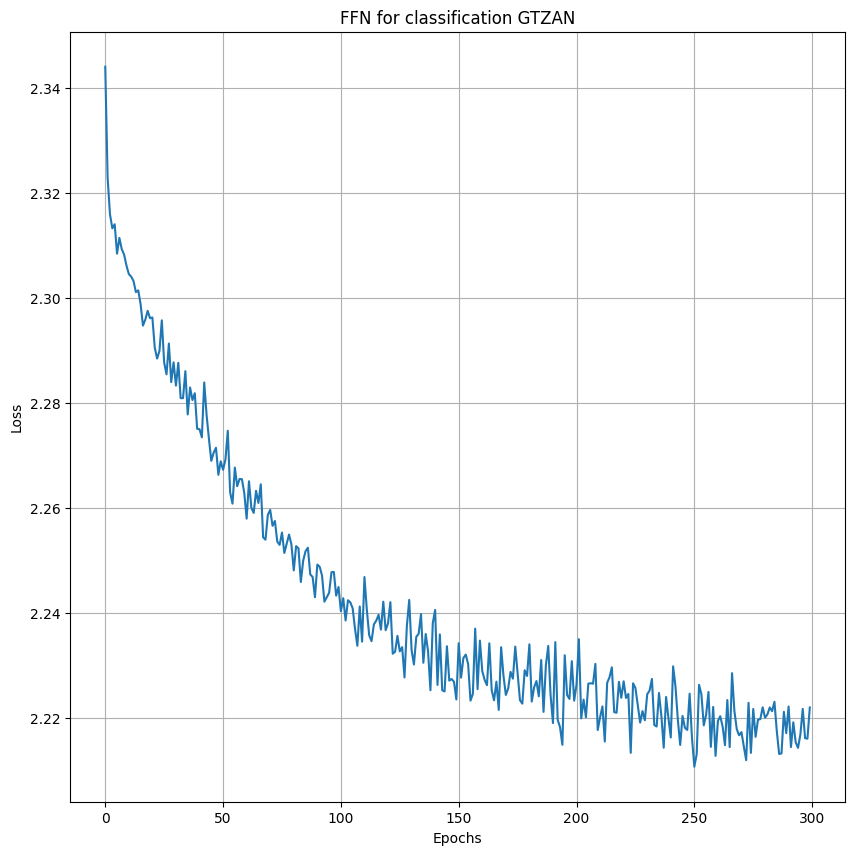

In [ ]:
import matplotlib.pyplot as plt

plt.plot(loss_for_draw)
plt.title('FFN for classification GTZAN')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

def predict(x, network):
  network.eval()
  with torch.no_grad():
    predited_label = network(x.float())
  return predited_label.argmax(1)

def get_score(loader, network):
  y_true = []
  y_pred = []
  for idx, (x, y) in enumerate(loader):
    x = x.to(device)
    y_pred.extend(list(predict(x, network).cpu().detach().numpy()))
    y_true.extend(list(y.detach().numpy()))
  return accuracy_score(y_true, y_pred), y_true, y_pred

In [ ]:
acc, y_t, y_p = get_score(testloader, net)
acc

<ipython-input-68-ea2724df9b57>:10: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = F.softmax(self.fc2(x))


0.29333333333333333

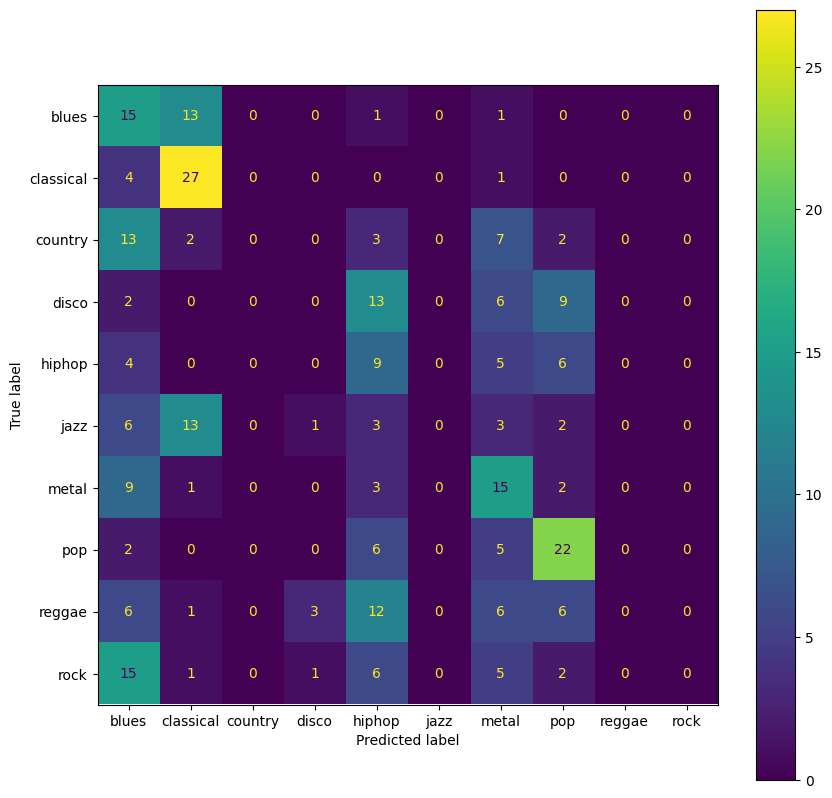

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_true_name = [num2class[i] for i in y_t]
y_pred_name = [num2class[i] for i in y_p]

# experiment.log_confusion_matrix(y_true=y_t, y_predicted=y_p)

plt.rcParams['figure.figsize'] = [10, 10]
cm = confusion_matrix(y_true_name, y_pred_name, labels=list(num2class.values()))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(num2class.values()))
disp.plot()
plt.show()

#### Сохраняем

In [ ]:
# Задание пути для сохранения чекпоинта
checkpoint_path = 'checkpoint.pth'

# Создание словаря с параметрами для сохранения
checkpoint = {
    'model_state_dict': net.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    # Другие данные, если нужно
}

# Сохранение чекпоинта
torch.save(checkpoint, checkpoint_path)

In [ ]:
# Загрузка чекпоинта
checkpoint = torch.load(checkpoint_path)

# Восстановление модели и оптимизатора из чекпоинта
net.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

### Задание на лабораторную работу (10 баллов)

1. Произведите доработку кода:  
      I. Разделите итоговый набор данных на: трейновую, валидационную и тестовую выборки (например 70\15\15). Для упрощения жизни можете сделать 70 / 30, валидационная = тестовая.   
      II. В коцнце каждой эпохи на валидационной выборке посчитайте метрики (3 штуки) и залогируйте их. Попробуйте посчитать метрики на трейновой выборке во время обучения.
2. Обучить 3 различных полносвязных нейронных сети (различные функции активации; количество нейронов, слоев; использование нормализации или, наоборот, без нормализации; различные оптимизаторы, или, например, добавть расписание для оптимизаторв; батч нормализация)
3. Расчитать метрики: acc, f-1 и третья - на ваш выбор
4. Сохраните все 3 полученные нейронные сети в чекпоинты.
4. Для каждого эксперемента произвести анализ confuision matrix
5. В конце создать итоговую таблицу с эксперминетами и результатами. Сделать выводы.
6. Изучите возможности comet ml, добавьте интересное логирование, например, аудио и его метка от НС. Во время защиты продемонстрируйте, что вы налогировали в comet ml.

#### Setup

In [ ]:
!pip install -q comet_ml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 648.9/648.9 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.1/267.1 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.1/979.1 kB 35.8 MB/s eta 0:00:00


In [ ]:
!wget "https://www.dropbox.com/scl/fi/n7goyj490phygdnazply2/smile_features.npy?rlkey=3x5dkhb7ykmke40y7p6qkd5r0&dl=0" -O smile_features.npy

--2024-04-24 20:56:49--  https://www.dropbox.com/scl/fi/n7goyj490phygdnazply2/smile_features.npy?rlkey=3x5dkhb7ykmke40y7p6qkd5r0&dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6027:18::a27d:4812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc59ec036f184a86ee7ecfa7c3c7.dl.dropboxusercontent.com/cd/0/inline/CRoQhDmbASN-28OaW4mK7Hgt-y1vNa7WqhCbsqRjPaYmCRfYpZjuWwJquqAFoCS_O_bgwXD_JLceqKpuJlj4v4_xLGGTMbi4_DF1Zbj28o4ncDldgfMLBfeVXzC8HT2TdrYAHeYr-_9mGyBvjfiWRB6l/file# [following]
--2024-04-24 20:56:49--  https://uc59ec036f184a86ee7ecfa7c3c7.dl.dropboxusercontent.com/cd/0/inline/CRoQhDmbASN-28OaW4mK7Hgt-y1vNa7WqhCbsqRjPaYmCRfYpZjuWwJquqAFoCS_O_bgwXD_JLceqKpuJlj4v4_xLGGTMbi4_DF1Zbj28o4ncDldgfMLBfeVXzC8HT2TdrYAHeYr-_9mGyBvjfiWRB6l/file
Resolving uc59ec036f184a86ee7ecfa7c3c7.dl.dropboxusercontent.com (uc59ec036f184a86ee7ecfa7c3c7.dl.dropboxusercontent.com)... 162.125.

In [ ]:
import numpy as np
import pandas as pd
import torch
import random
import matplotlib.pyplot as plt

from torch import nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from IPython.display import clear_output


SEED = 8642

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

#### Data

In [ ]:
data = np.load('smile_features.npy', allow_pickle=True)
data[:5]

array([{'id': 0, 'features': array([  3.0772326 ,   0.66488117,   0.20857047, ...,  50.88457   ,
              101.54951   ,  51.351048  ], dtype=float32), 'genre': 0}                          ,
       {'id': 1, 'features': array([2.9191518e+00, 8.4030800e-02, 1.8747907e-02, ..., 5.1134155e+01,
              9.4596451e+01, 5.2037270e+01], dtype=float32), 'genre': 0}                            ,
       {'id': 2, 'features': array([ 4.276291 ,  0.9758955,  0.5952461, ..., 50.3021   , 96.13825  ,
              53.04488  ], dtype=float32), 'genre': 0}                                              ,
       {'id': 3, 'features': array([ 3.033263,  0.407767,  0.361232, ..., 45.567436, 81.05081 ,
              46.412945], dtype=float32), 'genre': 0}                                          ,
       {'id': 4, 'features': array([3.89178252e+00, 1.07800469e-01, 2.10244387e-01, ...,
              7.30443115e+01, 1.20490204e+02, 6.69636536e+01], dtype=float32), 'genre': 0}],
      dtype=object)

In [ ]:
data[0]['features'].shape

(6373,)

In [ ]:
class GenreDataset(Dataset):
    def __init__(self, data, mean = None, std = None):
        features = np.array([elem['features'] for elem in data])
        if not mean:
            self.mean = features.mean()
            self.std = features.std()
        else:
            self.mean = mean
            self.std = std
        self.features = torch.Tensor((features - self.mean) / self.std)
        self.genre = torch.Tensor([elem['genre'] for elem in data]).to(torch.long) #, dtype=torch.long)
        self.ids = torch.Tensor([elem['id'] for elem in data]).to(torch.long)

    def __getitem__(self, index):
        return self.ids[index], self.features[index], self.genre[index]

    def __len__(self):
        return self.genre.size(0)

In [ ]:
train_data, test_data = train_test_split(data, test_size=0.3, random_state=SEED)

In [ ]:
train_dataset = GenreDataset(train_data)
test_dataset = GenreDataset(test_data, train_dataset.mean, train_dataset.std)

TRAIN_BATCH_SIZE = 32
VAL_BATCH_SIZE = 32

train_dataloader = DataLoader(train_dataset, batch_size=TRAIN_BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(train_dataset, batch_size=VAL_BATCH_SIZE)

In [ ]:
train_dataset[344]

(tensor(780),
 tensor([-0.0075, -0.0075, -0.0075,  ..., -0.0075, -0.0075, -0.0075]),
 tensor(7))

#### MLP

In [ ]:
import comet_ml
from comet_ml import Experiment


# Create an experiment with your api key
experiment = Experiment(
    api_key="u3II3PS5lzX2zammtKFv2qW5R",
    project_name="lab5_music",
    workspace="down-shift"
)

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch, sklearn.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/down-shift/lab5-music/15c69d36bc8b48e187df3590b4399d6e



In [ ]:
experiment.log_parameter("TRAIN_BATCH_SIZE", TRAIN_BATCH_SIZE)
experiment.log_parameter("VAL_BATCH_SIZE", VAL_BATCH_SIZE)

In [ ]:
class MusicMLP(nn.Module):
    def __init__(self, layer_dims: list, dropout_rate=0.3, use_batchnorm: bool = False):  # [6373, 1000, 100, 10]
        super().__init__()
        layers = []
        for i in range(len(layer_dims) - 1):
            layers.append(nn.Linear(layer_dims[i], layer_dims[i + 1]))
            if i < len(layer_dims) - 2:
                layers.append(nn.ReLU())
                if use_batchnorm:
                    layers.append(nn.BatchNorm1d(layer_dims[i + 1]))
                layers.append(nn.Dropout(p=dropout_rate))
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        x = self.layers(x)
        return x

In [ ]:
mlp = MusicMLP([6373, 1000, 100, 10])
mlp = mlp.to(device)
mlp

MusicMLP(
  (layers): Sequential(
    (0): Linear(in_features=6373, out_features=1000, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1000, out_features=100, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=100, out_features=10, bias=True)
  )
)

In [ ]:
mlp(torch.zeros((2, 6373)).to(device))

tensor([[-0.0742, -0.0172,  0.0545,  0.0199,  0.0709, -0.0027,  0.0075,  0.0664,
         -0.0715, -0.0438],
        [-0.0673, -0.0065,  0.0665,  0.0107,  0.0833, -0.0059,  0.0111,  0.0814,
         -0.0792, -0.0514]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
loss_fn = nn.CrossEntropyLoss()
lr = 3e-4
experiment.log_parameter('LEARINNG_RATE', lr)
optimizer = torch.optim.Adam(mlp.parameters(), lr=lr)

In [ ]:
EPOCHS = 200
experiment.log_parameter("EPOCHS", EPOCHS)
train_loss_hist, val_loss_hist = [], []
train_acc_hist, val_acc_hist = [], []

for epoch in range(EPOCHS):
    train_loss, val_loss = 0., 0.

    print(f'=== Training, epoch {epoch} ===')
    pbar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        pred = mlp(data)
        loss = loss_fn(pred, target)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        pbar.set_description(f'Loss: {loss.item()}')
        y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
        y_true.extend(target.detach().cpu().numpy().tolist())

    train_acc = accuracy_score(y_true, y_pred)
    train_acc_hist.append(train_acc)
    train_loss_hist.append(train_loss / len(train_dataloader))

    experiment.log_metrics({"train_loss": train_loss_hist[-1],
                            'train_accuracy': train_acc,
                            'train_precision': precision_score(y_true, y_pred, average='macro'),
                            'train_recall': recall_score(y_true, y_pred, average='macro'),
                            'train_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Train loss: {train_loss_hist[-1]}')
    print(f'Train accuracy: {train_acc}')

    print(f'=== Validating, epoch {epoch} ===')
    pbar = tqdm(enumerate(val_dataloader), total=len(val_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        with torch.no_grad():
            pred = mlp(data)
            loss = loss_fn(pred, target)
            val_loss += loss.item()
            rand = np.random.randint(0, len(id))
            idx = id[rand].item()
            if i % 20 == 0:
                experiment.log_audio(audio_data=dataset['train'][idx]['audio']['array'],
                                      sample_rate=dataset['train'][idx]['audio']['sampling_rate'],
                                      metadata={'label': num2class[pred.argmax(dim=-1)[rand].item()]},
                                      file_name=f'audio_{idx}.wav',
                                      step=epoch)
            pbar.set_description(f'Loss: {loss.item()}')
            y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
            y_true.extend(target.detach().cpu().numpy().tolist())

    val_acc = accuracy_score(y_true, y_pred)
    val_acc_hist.append(val_acc)
    val_loss_hist.append(val_loss / len(val_dataloader))

    experiment.log_metrics({"val_loss": val_loss_hist[-1],
                            'val_accuracy': val_acc,
                            'val_precision': precision_score(y_true, y_pred, average='macro'),
                            'val_recall': recall_score(y_true, y_pred, average='macro'),
                            'val_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Val loss: {val_loss_hist[-1]}')
    print(f'Val accuracy: {val_acc}')

    if epoch % 20 == 20 - 1:
        clear_output(wait=True)

=== Training, epoch 180 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.775335972959345
Train accuracy: 0.31759656652360513
=== Validating, epoch 180 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7685293663631787
Val accuracy: 0.3290414878397711
=== Training, epoch 181 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7744356935674495
Train accuracy: 0.3319027181688126
=== Validating, epoch 181 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7590476707978682
Val accuracy: 0.3133047210300429
=== Training, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7635837955908342
Train accuracy: 0.3261802575107296
=== Validating, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.765282240780917
Val accuracy: 0.3333333333333333
=== Training, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7692789001898332
Train accuracy: 0.31759656652360513
=== Validating, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7572106881575151
Val accuracy: 0.33476394849785407
=== Training, epoch 184 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.768466060811823
Train accuracy: 0.32761087267525035
=== Validating, epoch 184 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7604995695027439
Val accuracy: 0.32331902718168815
=== Training, epoch 185 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7672630927779458
Train accuracy: 0.3104434907010014
=== Validating, epoch 185 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7608832229267468
Val accuracy: 0.3290414878397711
=== Training, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7695113637230613
Train accuracy: 0.32474964234620884
=== Validating, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.763043847951022
Val accuracy: 0.32331902718168815
=== Training, epoch 187 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.780388441952792
Train accuracy: 0.3218884120171674
=== Validating, epoch 187 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7603089538487522
Val accuracy: 0.3261802575107296
=== Training, epoch 188 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7672234177589417
Train accuracy: 0.31187410586552217
=== Validating, epoch 188 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7556884776462207
Val accuracy: 0.32045779685264664
=== Training, epoch 189 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.776225041259419
Train accuracy: 0.32045779685264664
=== Validating, epoch 189 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7599678202108904
Val accuracy: 0.3319027181688126
=== Training, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7634084549817173
Train accuracy: 0.3190271816881259
=== Validating, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.764870356429707
Val accuracy: 0.3333333333333333
=== Training, epoch 191 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7747894362969832
Train accuracy: 0.32474964234620884
=== Validating, epoch 191 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.757048558105122
Val accuracy: 0.3261802575107296
=== Training, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7749472423033281
Train accuracy: 0.31616595135908443
=== Validating, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7620023434812373
Val accuracy: 0.3261802575107296
=== Training, epoch 193 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7738819609988818
Train accuracy: 0.3190271816881259
=== Validating, epoch 193 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7684235952117227
Val accuracy: 0.32331902718168815
=== Training, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7627240094271572
Train accuracy: 0.3290414878397711
=== Validating, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7664613886313005
Val accuracy: 0.32761087267525035
=== Training, epoch 195 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7691768136891453
Train accuracy: 0.31187410586552217
=== Validating, epoch 195 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7537460002032192
Val accuracy: 0.32331902718168815
=== Training, epoch 196 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7742363268678838
Train accuracy: 0.3218884120171674
=== Validating, epoch 196 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.762322718446905
Val accuracy: 0.32045779685264664
=== Training, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.764121109789068
Train accuracy: 0.3319027181688126
=== Validating, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7600936022671787
Val accuracy: 0.3319027181688126
=== Training, epoch 198 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7606455358591946
Train accuracy: 0.31616595135908443
=== Validating, epoch 198 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.757421444762837
Val accuracy: 0.31616595135908443
=== Training, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7628553130409934
Train accuracy: 0.32045779685264664
=== Validating, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.761304573579268
Val accuracy: 0.3261802575107296


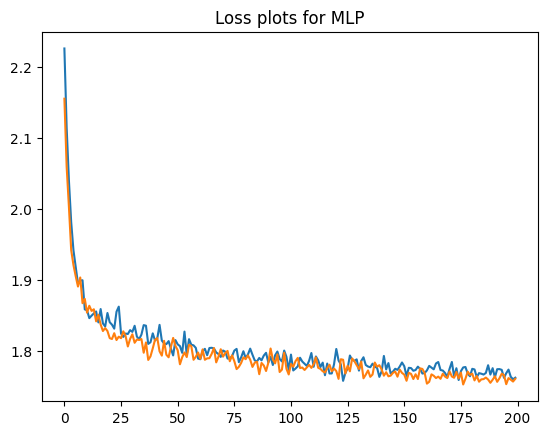

In [ ]:
plt.plot(train_loss_hist)
plt.plot(val_loss_hist)
plt.title('Loss plots for MLP')
plt.show()

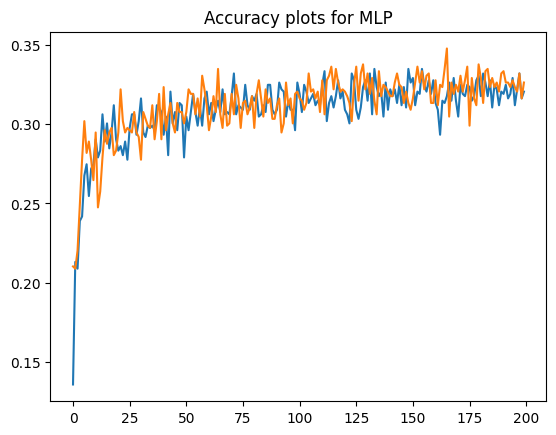

In [ ]:
plt.plot(train_acc_hist)
plt.plot(val_acc_hist)
plt.title('Accuracy plots for MLP')
plt.show()

In [ ]:
experiment.end()

COMET WARNING: Couldn't retrieve Google Colab notebook content
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : slow_soup_345
COMET INFO:     url                   : https://www.comet.com/down-shift/lab5-music/9fc6431aae36439eb62ab6d6cff63706
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     train_accuracy [200]  : (0.21602288984263232, 0.38483547925608014)
COMET INFO:     train_f1 [200]        : (0.21255232354733028, 0.36496148058332745)
COMET INFO:     train_loss [200]      : (1.6734588850628247, 2.0929924954067576)
COMET INFO:     train_precision [200] : (0.2111529995638349, 0.36982239364480707)
COMET INFO:     train_recall [200]    : (0.2176550898051707, 0.3836147570932647)
COMET INFO: 

#### Deeper MLP

In [ ]:
experiment = Experiment(
    api_key="u3II3PS5lzX2zammtKFv2qW5R",
    project_name="lab5_music",
    workspace="down-shift"
)

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch, sklearn.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/down-shift/lab5-music/3c4fd1da845847a493779fba74235171



In [ ]:
deeper_mlp = MusicMLP([6373, 2000, 1000, 1000, 100, 10], dropout_rate=0.5).to(device)
deeper_mlp

MusicMLP(
  (layers): Sequential(
    (0): Linear(in_features=6373, out_features=2000, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=2000, out_features=1000, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=1000, out_features=1000, bias=True)
    (7): ReLU()
    (8): Dropout(p=0.5, inplace=False)
    (9): Linear(in_features=1000, out_features=100, bias=True)
    (10): ReLU()
    (11): Dropout(p=0.5, inplace=False)
    (12): Linear(in_features=100, out_features=10, bias=True)
  )
)

In [ ]:
loss_fn = nn.CrossEntropyLoss()
lr = 3e-4
experiment.log_parameter('LEARINNG_RATE', lr)
optimizer = torch.optim.Adam(deeper_mlp.parameters(), lr=lr)

In [ ]:
EPOCHS = 200
experiment.log_parameter("EPOCHS", EPOCHS)
train_loss_hist, val_loss_hist = [], []
train_acc_hist, val_acc_hist = [], []

for epoch in range(EPOCHS):
    train_loss, val_loss = 0., 0.

    print(f'=== Training, epoch {epoch} ===')
    pbar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        pred = deeper_mlp(data)
        loss = loss_fn(pred, target)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        pbar.set_description(f'Loss: {loss.item()}')
        y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
        y_true.extend(target.detach().cpu().numpy().tolist())

    train_acc = accuracy_score(y_true, y_pred)
    train_acc_hist.append(train_acc)
    train_loss_hist.append(train_loss / len(train_dataloader))

    experiment.log_metrics({"train_loss": train_loss_hist[-1],
                            'train_accuracy': train_acc,
                            'train_precision': precision_score(y_true, y_pred, average='macro'),
                            'train_recall': recall_score(y_true, y_pred, average='macro'),
                            'train_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Train loss: {train_loss_hist[-1]}')
    print(f'Train accuracy: {train_acc}')

    print(f'=== Validating, epoch {epoch} ===')
    pbar = tqdm(enumerate(val_dataloader), total=len(val_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        with torch.no_grad():
            pred = deeper_mlp(data)
            loss = loss_fn(pred, target)
            val_loss += loss.item()
            rand = np.random.randint(0, len(id))
            idx = id[rand].item()
            if i % 20 == 0:
                experiment.log_audio(audio_data=dataset['train'][idx]['audio']['array'],
                                      sample_rate=dataset['train'][idx]['audio']['sampling_rate'],
                                      metadata={'label': num2class[pred.argmax(dim=-1)[rand].item()]},
                                      file_name=f'audio_{idx}.wav',
                                      step=epoch)
            pbar.set_description(f'Loss: {loss.item()}')
            y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
            y_true.extend(target.detach().cpu().numpy().tolist())

    val_acc = accuracy_score(y_true, y_pred)
    val_acc_hist.append(val_acc)
    val_loss_hist.append(val_loss / len(val_dataloader))

    experiment.log_metrics({"val_loss": val_loss_hist[-1],
                            'val_accuracy': val_acc,
                            'val_precision': precision_score(y_true, y_pred, average='macro'),
                            'val_recall': recall_score(y_true, y_pred, average='macro'),
                            'val_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Val loss: {val_loss_hist[-1]}')
    print(f'Val accuracy: {val_acc}')

    if epoch % 20 == 20 - 1:
        clear_output(wait=True)

=== Training, epoch 180 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8037667057730935
Train accuracy: 0.31616595135908443
=== Validating, epoch 180 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7925434871153398
Val accuracy: 0.3190271816881259
=== Training, epoch 181 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8027382763949307
Train accuracy: 0.3133047210300429
=== Validating, epoch 181 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7947275150905957
Val accuracy: 0.31187410586552217
=== Training, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7922208471731707
Train accuracy: 0.3133047210300429
=== Validating, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7947127439758994
Val accuracy: 0.3261802575107296
=== Training, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.813137097792192
Train accuracy: 0.3061516452074392
=== Validating, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.793017241087827
Val accuracy: 0.3133047210300429
=== Training, epoch 184 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8024345257065513
Train accuracy: 0.3133047210300429
=== Validating, epoch 184 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7800462462685325
Val accuracy: 0.31616595135908443
=== Training, epoch 185 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7926022464578801
Train accuracy: 0.30472103004291845
=== Validating, epoch 185 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7948979410258206
Val accuracy: 0.3061516452074392
=== Training, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7707756107503718
Train accuracy: 0.31616595135908443
=== Validating, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.788015278902921
Val accuracy: 0.3218884120171674
=== Training, epoch 187 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8067418336868286
Train accuracy: 0.30472103004291845
=== Validating, epoch 187 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7700039527632974
Val accuracy: 0.31187410586552217
=== Training, epoch 188 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7906379157846624
Train accuracy: 0.33047210300429186
=== Validating, epoch 188 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.771863422610543
Val accuracy: 0.31616595135908443
=== Training, epoch 189 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7959605021910234
Train accuracy: 0.31616595135908443
=== Validating, epoch 189 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.8001906059005044
Val accuracy: 0.30472103004291845
=== Training, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7956586696884849
Train accuracy: 0.3032904148783977
=== Validating, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7817787690596147
Val accuracy: 0.30758226037195996
=== Training, epoch 191 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8013313683596524
Train accuracy: 0.33476394849785407
=== Validating, epoch 191 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7773541537198154
Val accuracy: 0.32045779685264664
=== Training, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7841041575778613
Train accuracy: 0.30042918454935624
=== Validating, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7946901483969255
Val accuracy: 0.30472103004291845
=== Training, epoch 193 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7971248735081067
Train accuracy: 0.30185979971387694
=== Validating, epoch 193 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.8091644536365161
Val accuracy: 0.2989985693848355
=== Training, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7998637448657642
Train accuracy: 0.30185979971387694
=== Validating, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7810150601647117
Val accuracy: 0.32331902718168815
=== Training, epoch 195 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7883239767768166
Train accuracy: 0.32331902718168815
=== Validating, epoch 195 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7915209911086343
Val accuracy: 0.32474964234620884
=== Training, epoch 196 ===


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.8077294067902998
Train accuracy: 0.31759656652360513
=== Validating, epoch 196 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.8030384887348523
Val accuracy: 0.3133047210300429
=== Training, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7775339430028743
Train accuracy: 0.30758226037195996
=== Validating, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.783771569078619
Val accuracy: 0.30042918454935624
=== Training, epoch 198 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7764410810037092
Train accuracy: 0.3190271816881259
=== Validating, epoch 198 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.8008717461065813
Val accuracy: 0.3133047210300429
=== Training, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.808001767505299
Train accuracy: 0.32045779685264664
=== Validating, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7942045439373364
Val accuracy: 0.3090128755364807


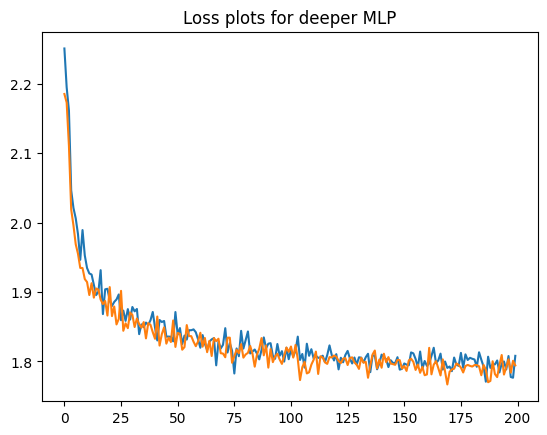

In [ ]:
plt.plot(train_loss_hist)
plt.plot(val_loss_hist)
plt.title('Loss plots for deeper MLP')
plt.show()

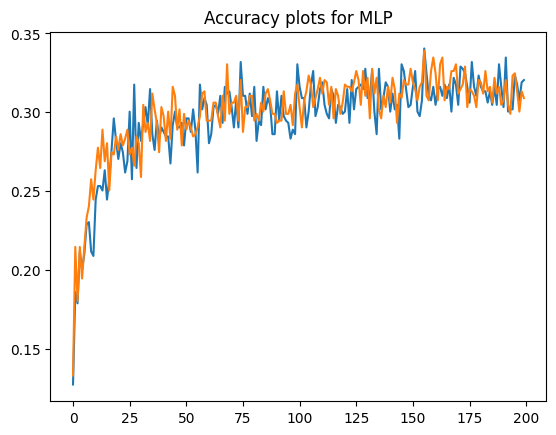

In [ ]:
plt.plot(train_acc_hist)
plt.plot(val_acc_hist)
plt.title('Accuracy plots for MLP')
plt.show()

In [ ]:
experiment.end()

COMET WARNING: Couldn't retrieve Google Colab notebook content
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : marked_swordtail_8297
COMET INFO:     url                   : https://www.comet.com/down-shift/lab5-music/3c4fd1da845847a493779fba74235171
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     train_accuracy [200]  : (0.12732474964234622, 0.34048640915593703)
COMET INFO:     train_f1 [200]        : (0.07427866308616556, 0.2995322687373104)
COMET INFO:     train_loss [200]      : (1.7707756107503718, 2.2508458115837793)
COMET INFO:     train_precision [200] : (0.08302680634279344, 0.3842931054137427)
COMET INFO:     train_recall [200]    : (0.13496442281495885, 0.3438235479606274)
COME

#### Smaller MLP with BatchNorm and dropout

In [ ]:
experiment = Experiment(
    api_key="u3II3PS5lzX2zammtKFv2qW5R",
    project_name="lab5_music",
    workspace="down-shift"
)

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch, sklearn.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/content' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/down-shift/lab5-music/82d02a45a1214c33abcedf5bab0ef9e8



In [ ]:
smaller_mlp = MusicMLP([6373, 1000, 1000, 10], dropout_rate=0.1, use_batchnorm=True).to(device)
smaller_mlp

MusicMLP(
  (layers): Sequential(
    (0): Linear(in_features=6373, out_features=1000, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(1000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Linear(in_features=1000, out_features=1000, bias=True)
    (5): ReLU()
    (6): BatchNorm1d(1000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.1, inplace=False)
    (8): Linear(in_features=1000, out_features=10, bias=True)
  )
)

In [ ]:
loss_fn = nn.CrossEntropyLoss()
lr = 3e-4
experiment.log_parameter('LEARINNG_RATE', lr)
optimizer = torch.optim.Adam(smaller_mlp.parameters(), lr=lr)

In [ ]:
EPOCHS = 200
experiment.log_parameter("EPOCHS", EPOCHS)
train_loss_hist, val_loss_hist = [], []
train_acc_hist, val_acc_hist = [], []

for epoch in range(EPOCHS):
    train_loss, val_loss = 0., 0.

    print(f'=== Training, epoch {epoch} ===')
    pbar = tqdm(enumerate(train_dataloader), total=len(train_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        pred = smaller_mlp(data)
        loss = loss_fn(pred, target)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        pbar.set_description(f'Loss: {loss.item()}')
        y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
        y_true.extend(target.detach().cpu().numpy().tolist())

    train_acc = accuracy_score(y_true, y_pred)
    train_acc_hist.append(train_acc)
    train_loss_hist.append(train_loss / len(train_dataloader))

    experiment.log_metrics({"train_loss": train_loss_hist[-1],
                            'train_accuracy': train_acc,
                            'train_precision': precision_score(y_true, y_pred, average='macro'),
                            'train_recall': recall_score(y_true, y_pred, average='macro'),
                            'train_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Train loss: {train_loss_hist[-1]}')
    print(f'Train accuracy: {train_acc}')

    print(f'=== Validating, epoch {epoch} ===')
    pbar = tqdm(enumerate(val_dataloader), total=len(val_dataloader))
    y_pred, y_true = [], []

    for i, (id, data, target) in pbar:
        data = data.to(device)
        target = target.to(device)

        with torch.no_grad():
            pred = smaller_mlp(data)
            loss = loss_fn(pred, target)
            val_loss += loss.item()
            rand = np.random.randint(0, len(id))
            idx = id[rand].item()
            if i % 20 == 0:
                experiment.log_audio(audio_data=dataset['train'][idx]['audio']['array'],
                                      sample_rate=dataset['train'][idx]['audio']['sampling_rate'],
                                      metadata={'label': num2class[pred.argmax(dim=-1)[rand].item()]},
                                      file_name=f'audio_{idx}.wav',
                                      step=epoch)
            pbar.set_description(f'Loss: {loss.item()}')
            y_pred.extend(pred.argmax(dim=-1).detach().cpu().numpy().tolist())
            y_true.extend(target.detach().cpu().numpy().tolist())

    val_acc = accuracy_score(y_true, y_pred)
    val_acc_hist.append(val_acc)
    val_loss_hist.append(val_loss / len(val_dataloader))

    experiment.log_metrics({"val_loss": val_loss_hist[-1],
                            'val_accuracy': val_acc,
                            'val_precision': precision_score(y_true, y_pred, average='macro'),
                            'val_recall': recall_score(y_true, y_pred, average='macro'),
                            'val_f1': f1_score(y_true, y_pred, average='macro')}, epoch=epoch)
    experiment.log_confusion_matrix(y_true=y_true, y_predicted=y_pred)

    print(f'Val loss: {val_loss_hist[-1]}')
    print(f'Val accuracy: {val_acc}')

    if epoch % 20 == 20 - 1:
        clear_output(wait=True)

=== Training, epoch 180 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7465765963901172
Train accuracy: 0.33905579399141633
=== Validating, epoch 180 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6789260018955579
Val accuracy: 0.3562231759656652
=== Training, epoch 181 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.739222369410775
Train accuracy: 0.3319027181688126
=== Validating, epoch 181 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7325362238016995
Val accuracy: 0.3562231759656652
=== Training, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7479052218523892
Train accuracy: 0.35050071530758226
=== Validating, epoch 182 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7147057869217612
Val accuracy: 0.37339055793991416
=== Training, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.729908043687994
Train accuracy: 0.34620886981402005
=== Validating, epoch 183 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7302823662757874
Val accuracy: 0.33905579399141633
=== Training, epoch 184 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7407939108935269
Train accuracy: 0.35765379113018597
=== Validating, epoch 184 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7051466324112632
Val accuracy: 0.33905579399141633
=== Training, epoch 185 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7491353912787004
Train accuracy: 0.3261802575107296
=== Validating, epoch 185 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7148868279023604
Val accuracy: 0.3447782546494993
=== Training, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7173382910815151
Train accuracy: 0.33905579399141633
=== Validating, epoch 186 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.702694134278731
Val accuracy: 0.3319027181688126
=== Training, epoch 187 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7538361495191401
Train accuracy: 0.3290414878397711
=== Validating, epoch 187 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7092585292729465
Val accuracy: 0.37339055793991416
=== Training, epoch 188 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7335742928765037
Train accuracy: 0.34048640915593703
=== Validating, epoch 188 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.674372667616064
Val accuracy: 0.35336194563662376
=== Training, epoch 189 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7264650084755637
Train accuracy: 0.3376251788268956
=== Validating, epoch 189 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.677034941586581
Val accuracy: 0.3719599427753934
=== Training, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7382990609515796
Train accuracy: 0.3590844062947067
=== Validating, epoch 190 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6711063385009766
Val accuracy: 0.3605150214592275
=== Training, epoch 191 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7188583341511814
Train accuracy: 0.3218884120171674
=== Validating, epoch 191 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.699889686974612
Val accuracy: 0.3333333333333333
=== Training, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.732314559546384
Train accuracy: 0.34334763948497854
=== Validating, epoch 192 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6953342286023227
Val accuracy: 0.33905579399141633
=== Training, epoch 193 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7014785300601611
Train accuracy: 0.3562231759656652
=== Validating, epoch 193 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.703393367203799
Val accuracy: 0.3676680972818312
=== Training, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.730450906536796
Train accuracy: 0.3419170243204578
=== Validating, epoch 194 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7157513174143704
Val accuracy: 0.3419170243204578
=== Training, epoch 195 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7423474571921609
Train accuracy: 0.34048640915593703
=== Validating, epoch 195 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6641498316418042
Val accuracy: 0.37339055793991416
=== Training, epoch 196 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.725355706431649
Train accuracy: 0.3376251788268956
=== Validating, epoch 196 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7212850722399624
Val accuracy: 0.32331902718168815
=== Training, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7507410591298884
Train accuracy: 0.33047210300429186
=== Validating, epoch 197 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6976926055821506
Val accuracy: 0.35050071530758226
=== Training, epoch 198 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.707529685714028
Train accuracy: 0.35336194563662376
=== Validating, epoch 198 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.6752015406435186
Val accuracy: 0.3547925608011445
=== Training, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Train loss: 1.7421751510013233
Train accuracy: 0.3376251788268956
=== Validating, epoch 199 ===


  0%|          | 0/22 [00:00<?, ?it/s]

Val loss: 1.7102440324696628
Val accuracy: 0.34620886981402005


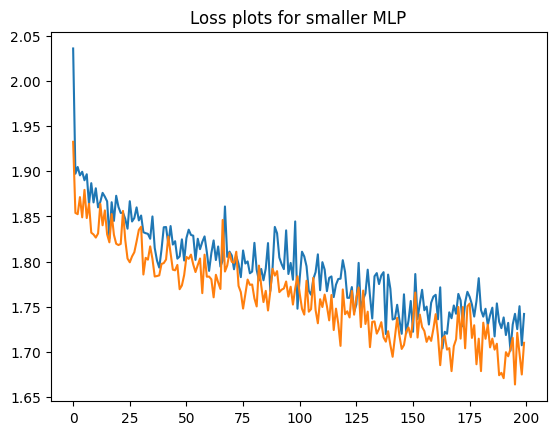

In [ ]:
plt.plot(train_loss_hist)
plt.plot(val_loss_hist)
plt.title('Loss plots for smaller MLP')
plt.show()

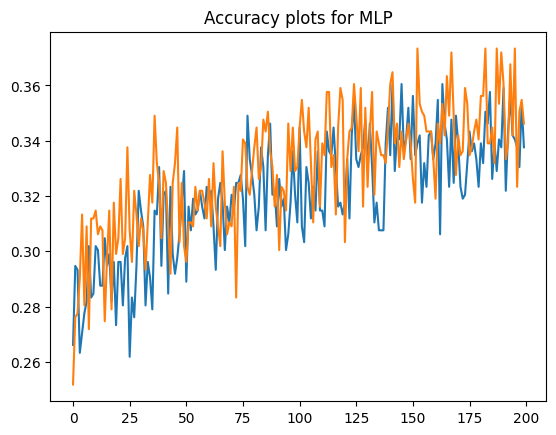

In [ ]:
plt.plot(train_acc_hist)
plt.plot(val_acc_hist)
plt.title('Accuracy plots for MLP')
plt.show()

### Выводы:
- модели схожи по метрикам, все примерно достигают top-1 accuracy 0.33 на датасете из 10 классов
- регуляризация придает моделям стабильности в процессе обучения, но в итоге прироста метрик нет
